# Проект : Рынок заведений общественного питания Москвы

**Описание проекта:**  
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель исследования:**  
Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Исходные данные:**
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание исходных данных:**  
`name` — название заведения;  

`address` — адрес заведения;  

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  

`hours` — информация о днях и часах работы;  

`lat` — широта географической точки, в которой находится заведение;  

`lng` — долгота географической точки, в которой находится заведение;  

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0); 

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
 * «Средний счёт: 1000–1500 ₽»;  
 * «Цена чашки капучино: 130–220 ₽»;  
 * «Цена бокала пива: 400–600 ₽».  
 * и так далее.  
 
`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill,начинающихся с подстроки «Цена одной чашки капучино»:  
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт. 

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
        0 — заведение не является сетевым  
        1 — заведение является сетевым  
        
`district` — административный район, в котором находится заведение, например Центральный административный округ;  

`seats` — количество посадочных мест.  

**План исследования:**
1. Загрузить и изучить данные
2. Выполнить предобработку
3. Анализ данных
4. Детализация исследования. Открытие конкретного заведения общественного питания
5. Подготовить презентацию для инвесторов


<hr style="border: 2px solid #425F57;" />

## Загрузка и изучение данных

In [1]:
#Импортируем библиотеки
import pandas as pd 
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
import scipy.stats as stats
import plotly.express as px
from scipy import stats as st
import math as mth
import seaborn as sns
!pip install folium
!pip install plotly
import json
import folium

In [2]:
#Открытие файла с данными
try:
    path = 'C:\\Users\\User\\OneDrive\\Рабочий стол\\проекты\\'
    df = pd.read_csv(path + 'moscow_places.csv') 
except: 
    path = '/datasets/moscow_places.csv'
    df = pd.read_csv(path) 

#выводим первые 5 строк датафрйема и общую информацию о нем
display(df.head())
display(df.info())

#подсчет общего количества заведений
print('Количество заведений общественного питания представленных в датафрейме:', df['name'].nunique())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Количество заведений общественного питания представленных в датафрейме: 5614


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* При первой визуальной оценке датафрейма видно что данные подходят к цели нашего исследования и соответсвуют описанию исходных данных
* В данных представлена информация о 8406 заведениях
* В датафрейме содержится 8 406 строк и 14 столбцов
* В датафрейме присутствуют пропуски,необоходимо проверить их отдельно
* Названия столбцов соответвуют их содержанию и приведены к единому стилю, переименовывать их не требуется
* В датафрейме представлены данные 3 типов данных: object, float64,int64. Содержание всех столбцов соответсвует типам данных, преобразование для дальнейшего исследования не требуется
</div>       
<br>

<hr style="border: 2px solid #425F57;" />

## Предобработка данных

### Проверка аномальных значений

Проверим данные на аномальные и выбивающиеся значения:

In [3]:
display(df.describe())

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
В датафрейме представлены 7 столбцов с числовыми значениями. После проверки на аномалии и выбросы можно сказать следующее:  
* в столбцах `lat` и `lng` выбивающихся значений нет, все данные соостветрвуют широте и долготе города Москва  
* в столбце `rating` данные также представлены верно, по шкале от 0 до 5   
* в столбце `middle_avg_bill` также представлены корректно, 35000 вполне возможный средний чек одного из топовых ресторанов Москвы. Нулевое значение также возможно, если например заведение новое, и данных о среднем чеке нет.  
* в столбце `middle_coffee_cup` стоимость варьируется от 60 до 1568. Верхняя граница кажется не очень правдоподобной. Проверем данные этого столбца отдельно.  
* в столбце `chain` есть два возможныз варинта 0 и 1, данные заполнены корректно  
* в столбце `seats` не правдополобным кажется максимальное значение. Проверим этот столбец отдельно  
</div>        
<br>

#### Проверка столбцов с аномальными значениями

Построим "ящик с усами" для столбца `middle_coffee_cup`, чтобы проверить аномальные значения

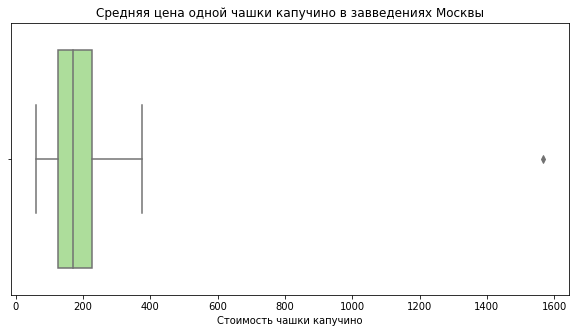

In [4]:
#строим "Ящик с усами"
plt.figure(figsize=(10, 5))
sns.set_palette('YlOrBr')
sns.boxplot(x='middle_coffee_cup', data=df,color='#A8E890')
plt.title('Средняя цена одной чашки капучино в завведениях Москвы')
plt.xlabel('Стоимость чашки капучино')
plt.show()

На графике мы увидели одно аномальное значение в сумме 1600 за одну чашку капучино. Посмотрим это заведение:

In [5]:
df.query("middle_coffee_cup ==1568")

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Скорее всего здесь ошибка в данных, и цена чашки капучино должна быть от 230 до 290. Удалим это значение чтобы не искажать данные в дальнейших исследованиях:

In [6]:
#удаляем аномальное значение
df = df.query("middle_coffee_cup !=1568")
#Проверяем
print(df['middle_coffee_cup'].describe())

count    534.000000
mean     172.112360
std       65.408333
min       60.000000
25%      124.250000
50%      168.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64


Построим "ящик с усами" для столбца `seats`, чтобы проверяить аномальные значения

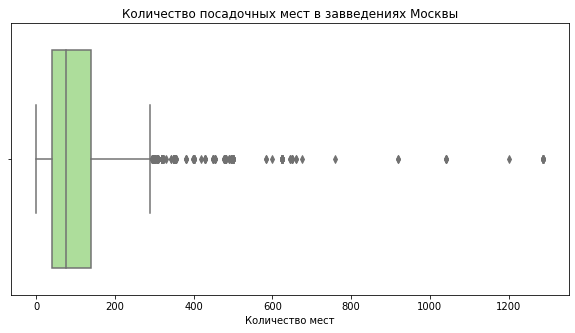

In [7]:
#строим "Ящик с усами"
plt.figure(figsize=(10, 5))
sns.boxplot(x='seats', data=df, color='#A8E890')
plt.title('Количество посадочных мест в завведениях Москвы')
plt.xlabel('Количество мест')
plt.show()

На графике видны сильные выбросы начинающиеся примерно от 500 посадочных мест. Скорее всего это огромные банкетные залы, или ошибки в данных. Посчитаем  сколько таких заведения в датафрейме:

In [8]:
print('Количеcтво заведений где посадочных мест больше 500:',len(df[df['seats']>=500]))

Количеcтво заведений где посадочных мест больше 500: 77


Количество небольшое, удалим эти значения чтобы не искажать данные в дальнейших исследованиях

In [9]:
#удаляем значения больше 500
s=df[df['seats'] >= 500]
data = df.query('index not in @s.index')

#Проверяем
print(data['seats'].describe())
print('Количество удаленных строк:',len(df)-len(data))

count    4717.000000
mean       98.341743
std        88.362714
min         0.000000
25%        40.000000
50%        70.000000
75%       130.000000
max       495.000000
Name: seats, dtype: float64
Количество удаленных строк: 77


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер, отлично поработала с аномалиями!
</div>

### Обработка пропусков

Исходя из полученной информации о данных видно, что в данных есть пропуски. Проверим это:

In [10]:
#Подсчитываем количество пропусков в каждом столбце
print('Колличество пропусков в столбцах:')
display(data.isna().sum())

#Подсчитываем % пропусков в данных в каждом столбце
print('Процент пропусков в столбцах:')
((data.isnull().sum ()/ len(data))* 100).round(2)

Колличество пропусков в столбцах:


name                    0
category                0
address                 0
district                0
hours                 528
lat                     0
lng                     0
rating                  0
price                5047
avg_bill             4552
middle_avg_bill      5212
middle_coffee_cup    7800
chain                   0
seats                3611
dtype: int64

Процент пропусков в столбцах:


name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.34
lat                   0.00
lng                   0.00
rating                0.00
price                60.60
avg_bill             54.66
middle_avg_bill      62.58
middle_coffee_cup    93.66
chain                 0.00
seats                43.36
dtype: float64

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Верное решение!
</div>

### Обработка дубликатов

Проверим датафрейм на явные дублкаты в данных:

In [11]:
print('Колличество дубликатов в датафрейме:',data.duplicated().sum())

Колличество дубликатов в датафрейме: 0


Из всех столбцов неявные дубликаты могли появится в столбцах с названием и адресом заведения. Проверим данные:

In [12]:
#приводим данные в столбцах к нижнему регистр
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
print('Количество дубликатов после преведния столбцов к нижнему регистру:',data.duplicated(subset=['name', 'address']).sum())

#Удаляем не явные дубликаты
data = data.drop_duplicates(subset=['name', 'address'])
print('Количество заведений после удаления не явных дублкикатов:',len(data))

Количество дубликатов после преведния столбцов к нижнему регистру: 4
Количество заведений после удаления не явных дублкикатов: 8324


/tmp/ipykernel_247/679354624.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['name'] = data['name'].str.lower()
/tmp/ipykernel_247/679354624.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['address'] = data['address'].str.lower()


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
   
* В данных явных дубликатов не выявлено
* Были обнаружены не явные дубликаты в столбцах с алдресом и названием заведния в количестве 4 штук. Дубликаты удалили
</div>       
<br>

### Создание дoполнительных столбцов

Создадим отдельные столбцы только с названием улицы и столбец с обозначением, что заведение работает ежедневно и круглосуточно:

In [13]:
#создаем столбец с названием улицы
data['street'] = data['address'].str.split(', ').str[1]
#создаем столбец 24/7
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

#проверяем
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


<hr style="border: 2px solid #425F57;" />

## Анализ данных

### Категории заведений

В датафрейме присуствует информация о категории заведения общественного питания. Изучим их подробнее:

,Категория заведения,Кол-во заведений
0,кафе,2354
1,ресторан,2021
2,кофейня,1397
3,"бар,паб",754
4,пиццерия,629
5,быстрое питание,601
6,столовая,313
7,булочная,255


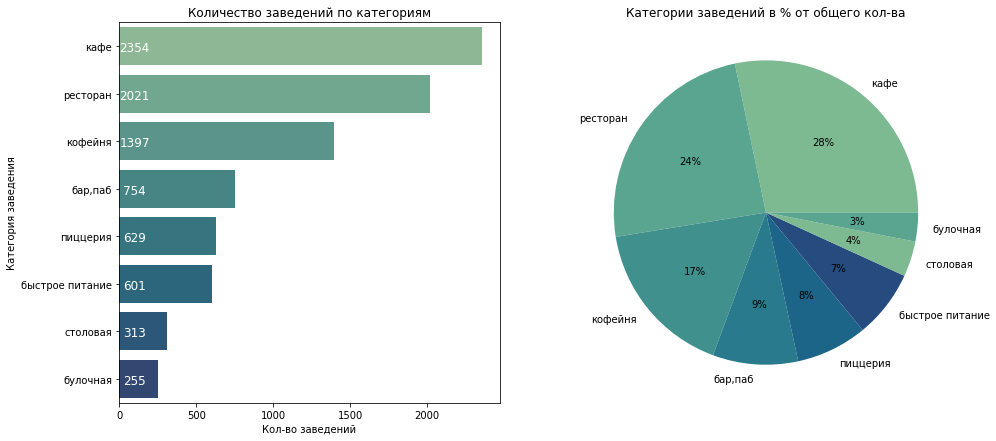

In [14]:
#создадим сводную таблицу по категориям и количеством заведений
category = data.groupby('category').agg({'name':'count'}) \
                    .sort_values('name', ascending=False).reset_index()\
                    .rename(columns={'category':'Категория заведения',
                                     'name':'Кол-во заведений'})                            
#выводим на экран полученную таблицу
display(category)

#выводим на экран столбчатую и круговую диаграмму
plt.figure(figsize=(15,7))
plt.subplot(121)
colors=sns.set_palette("crest")
ax=sns.barplot(y='Категория заведения', x='Кол-во заведений', data=category,palette="crest")
plt.title('Количество заведений по категориям')
for i in range(len(category['Кол-во заведений'])):
    ax.text(100, i, category['Кол-во заведений'][i], ha='center', va='center_baseline',c='white',size='large')

plt.subplot(122)
plt.pie(category['Кол-во заведений'], labels = category['Категория заведения'],colors=colors,autopct='%.0f%%')
plt.title('Категории заведений в % от общего кол-ва')
plt.show()

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* В датафрейме представлены 8 категорий заведений общественного питания Москвы: *кафе,ресторан, кофейня,бар/паб,пиццерия,быстрое питание, столовая, булочная*
* Топ-3 категории: *Кафе*-2354 заведения, *Ресторан*-2021 заведение, *Кофейня*-1397 заведений. Все вместе они занимают более 60% рынка заведений общественного питания
* Самая не популярная категория-*Булочные*-255 заведений
    
</div>       
<br>

### Количество посадочных мест по категориям

В датафрейме присуствует информация о количестве посадочных мест в заведених общественного питания. Изучим их подробнее:

,Категория заведения,Медианное кол-во посадочных мест
0,ресторан,85.0
1,"бар,паб",80.0
2,кофейня,76.0
3,столовая,75.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,52.0
7,булочная,50.0


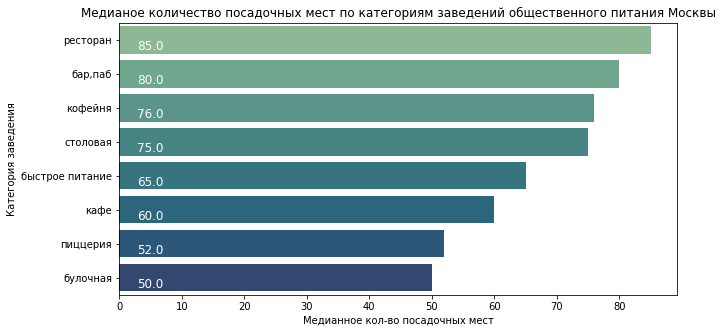

In [15]:
#строим сводную таблицу по каегориям с медианным количеством посадочных мест
seats=data.groupby('category').agg({'seats':'median' }) \
                    .sort_values('seats', ascending=False).reset_index()\
                    .rename(columns={'category':'Категория заведения',
                                    'seats':'Медианное кол-во посадочных мест'}) 
#выводим таблицу на экран
display(seats)

#cтроим график
plt.figure(figsize=(10, 5))
colors=sns.set_palette("crest")
ax = sns.barplot(y='Категория заведения', x='Медианное кол-во посадочных мест', data=seats, palette="crest")
for i in range(len(seats['Медианное кол-во посадочных мест'])):
    ax.text(5, i, seats['Медианное кол-во посадочных мест'][i], ha='center', va='top',c='white',size='large')
plt.title('Медианое количество посадочных мест по категориям заведений общественного питания Москвы')
plt.show()

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
Т.к. количество мест посадочных мест в каждом конктретном заведении может быть разным, мы сравнили медианные значения по каждой категории:
* Лидирует по медианному количеству посадочных мест категория рестораны, за ними идут бары и пабы. Это кажется логичным, т.к. в данных заведениях обычно проводят праздники и собираются большие компании
* Меньше всего посадочных мест обычно в булочных, что тоже поддается логике. Т.к. в основном там пьют кофе или берут заказы с собой.
    
</div>       
<br>

### Соотношение сетевых и несетевых заведений

Рассмотрим отношение сетевых и не сетевых заведений в Москве:

,Тип заведения,Кол-во заведений
0,0,5156
1,1,3168


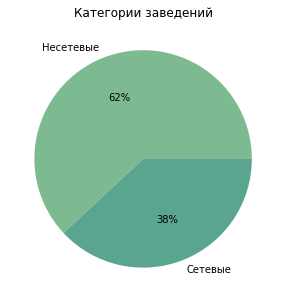

In [16]:
#строим таблицу по типу заведений и их количеству
chain = data['chain'].value_counts().reset_index()\
                     .rename(columns={'index':'Тип заведения',
                                     'chain':'Кол-во заведений'})
#выводим таблицу на экран                   
display(chain)

#строим круговую диаграмму
plt.figure(figsize=(10, 5))
colors=sns.set_palette("crest")
plt.pie(chain['Кол-во заведений'], labels = ['Несетевые', 'Сетевые'],colors=colors,autopct='%.0f%%')
plt.title('Категории заведений')
plt.show()

Также исследуем по категориям заведений, какие чаще всего являются сетевыми и несетевыми

chain,index,Категория,Не сетевые,Сетевые,Всего заведений,% сетевых заведений
0,6,булочная,99,156,255,61.18
1,3,пиццерия,301,328,629,52.15
2,2,кофейня,687,710,1397,50.82
3,4,быстрое питание,370,231,601,38.44
4,1,ресторан,1302,719,2021,35.58
5,0,кафе,1584,770,2354,32.71
6,7,столовая,226,87,313,27.80
7,5,"бар,паб",587,167,754,22.15


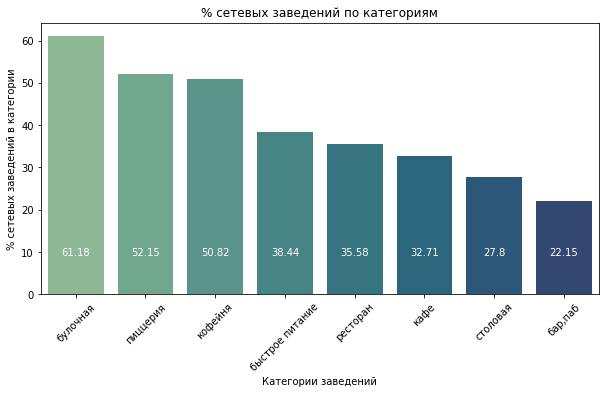

In [17]:
chain_category = data.pivot_table(index = 'category',values='name',columns = 'chain', aggfunc='count')\
                                .sort_values(by=1,ascending=False).reset_index()\
                                .rename(columns={0:'Не сетевые',1:'Сетевые','category':'Категория'})
chain_category['Всего заведений']=chain_category['Сетевые']+chain_category['Не сетевые']
chain_category['% сетевых заведений']=((chain_category['Сетевые']/chain_category['Всего заведений'])*100).round(2)
chain_category=chain_category.sort_values(by='% сетевых заведений',ascending=False).reset_index()
display(chain_category);

#chain_category.plot(x="Категория", y=["Сетевые", "Не сетевые"], kind="bar")
plt.figure(figsize=(10, 5))
colors=sns.set_palette("crest")
ax=sns.barplot(data=chain_category,x="Категория", y="% сетевых заведений",palette="crest")
for i in range(len(chain_category['% сетевых заведений'])):
    ax.text(i,10, chain_category['% сетевых заведений'][i], ha='center', va='center',c='white')
plt.title('% сетевых заведений по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('% сетевых заведений в категории')
plt.xticks (rotation= 45 );

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* Больше всего сетевых заведений в категориях кафе и рестораны (774 и 722 заведений соответсвенно)
* Меньше всего сетевых заведений в булочных и столовых
* В процентном соотношении больше сетевых заведений в булочных-61,18%,меньще всего в барах/пабах-22,15%
</div>       
<br>

### Топ-15 популярных сетей в Москве

Выберем их всех сетевых заведений Москвы 15 самые популярных. Под популярностью понимается количество заведений этой сети в регионе:

,Название сети,Категория заведения,Кол-во заведений
0,шоколадница,"[кофейня, кафе]",117
1,домино'с пицца,[пиццерия],76
2,додо пицца,[пиццерия],74
3,one price coffee,[кофейня],70
4,яндекс лавка,[ресторан],68
5,cofix,[кофейня],65
6,prime,"[ресторан, кафе]",50
7,хинкальная,"[быстрое питание, кафе, ресторан, столовая, ба...",44
8,кофепорт,[кофейня],42
9,кулинарная лавка братьев караваевых,[кафе],38


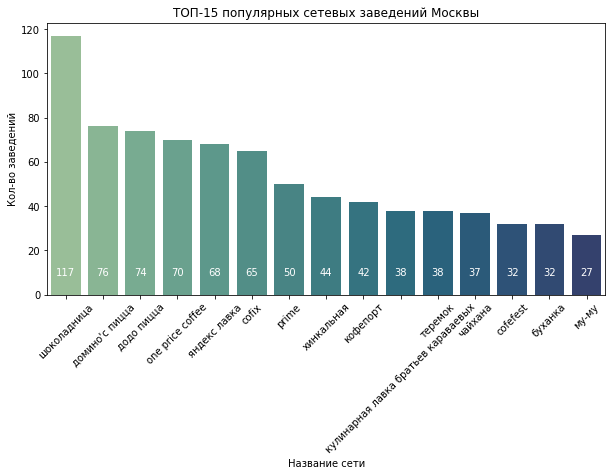

In [39]:
#создаем таблицу названием сети, категорией заведений и кол-вом заведений в ней
top_15=data.query('chain == 1').groupby('name').agg(сategoris=('category','unique'),
                                                    name_count=('name','count'))\
                        .sort_values('name_count', ascending=False).head(15).reset_index()\
                        .rename(columns={'name':'Название сети',
                                     'сategoris':'Категория заведения',
                                      'name_count':'Кол-во заведений'})
#Выводим на экран                                                   
display(top_15)

#Строим график
plt.figure(figsize=(10, 5))
sns.set_palette("crest")
ax = sns.barplot(x='Название сети', y='Кол-во заведений', data=top_15,palette="crest")
for i in range(len(top_15['Кол-во заведений'])):
    ax.text(i,10, top_15['Кол-во заведений'][i], ha='center', va='center',c='white')
plt.title('ТОП-15 популярных сетевых заведений Москвы')
plt.xticks (rotation= 45 )
plt.show()


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* Самой популярной сетью заведений в Москве является "Шоколадница", далее идут Домино`с Пицца и Додо пицца.
Данные сети объединяет то, что в большинстве из них можно взять еду или кофе навынос, или просто быстро перекусить.
* Среди популярных сетей чаще всего встречаются кофейни, пиццерии и рестораны быстрого питания
</div>       
<br>

### Распоположения заведение по административным районам Москвы

In [97]:
print('Количество представленных в данных административных округов Москвы:',data['district'].nunique())
district = data.pivot_table(index = 'district',values='name',columns = 'category', aggfunc='count',margins=True)\
                            .sort_values('All',axis=0, ascending=False)
district

Количество представленных в данных административных округов Москвы: 9


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
All,754,255,601,2354,1397,629,2021,313,8324
Центральный административный округ,364,50,86,459,425,113,662,66,2225
Южный административный округ,68,25,85,264,131,73,201,44,891
Северо-Восточный административный округ,62,28,82,266,159,68,182,40,887
Северный административный округ,66,38,58,230,186,74,183,40,875
Западный административный округ,46,37,62,233,146,70,213,23,830
Восточный административный округ,49,25,70,269,103,72,160,40,788
Юго-Восточный административный округ,38,13,67,282,89,55,144,25,713
Юго-Западный административный округ,38,27,61,236,96,64,167,17,706


<Figure size 1080x720 with 0 Axes>

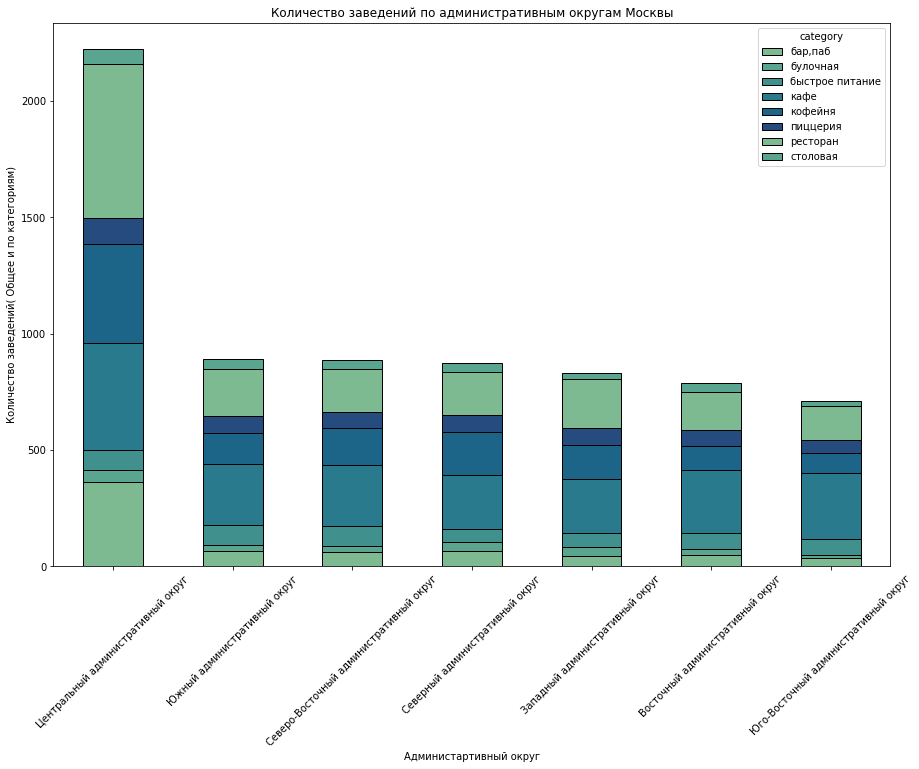

In [105]:
plt.figure(figsize=(15, 10))
colors=sns.set_palette("crest")
district.iloc[1:8, :-1].plot(kind='bar', stacked=True, figsize=(15, 10), ec='k',color=colors)
plt.title('Количество заведений по административным округам Москвы')
plt.xlabel('Администартивный округ')
plt.ylabel('Количество заведений( Общее и по категориям)')
plt.xticks (rotation= 45 )
plt.show()

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>

* В данных представлены заведения расположенные в 9 административынх окурга Москвы
* Больше всего заведений расположено в Центральном административном округе
* Меньше всего в Северо-Западном 
* В ЦАО преобладают кафе и рестораны. Кафе распределены равномерно по всем округам. Столовых меньше всего во всех округах
</div>       
<br>

### Распределение средних рейтингов по категориям

Визуализируем распределение средних рейтингов по категориям заведений. Т.к. выбросов или аномалий тут быть не может (рейтинг строго от 0 до 5), возьмем именно среднее значение, а не медиану

In [21]:
#Строим таблицу с категорими заведений и средним рейтингом
rating = data.groupby('category').agg({'rating': 'mean'}).round(2)\
                    .sort_values('rating', ascending=False).reset_index()\
                    .rename(columns={'rating':'Средний рейтинг',
                                     'category':'Категория заведения'})
#Выводим таблицу
display(rating)

,Категория заведения,Средний рейтинг
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
Средний рейтинг заведений по категориям не имеет сильно различия и варьируется от 4 до 5. Однако среди категорий средний рейтинг выше всех у баров\пабов, а ниже всего в заведений быстрого питания
 
</div>       
<br>

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [22]:
#группиурем таблицу по окургам и рейтингу
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')

# импортируем карту и хороплет
from folium import Map, Choropleth
with open('/datasets/admin_level_geomap.geojson') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
На получившемся графике видно что самый высокий средний рейтинг у заведений находящихся в Центральном административном округе, ниже всего в Северо-Восточный административном округе и Юго-Восточный административном округе
 
</div>       
<br>

### Заведения общественного питания на карте Москвы

In [23]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Карта отображается корректно!
</div>

### ТОП-15 улиц по количеству заведений

Количество улиц Москвы в предоставленных данных: 1447


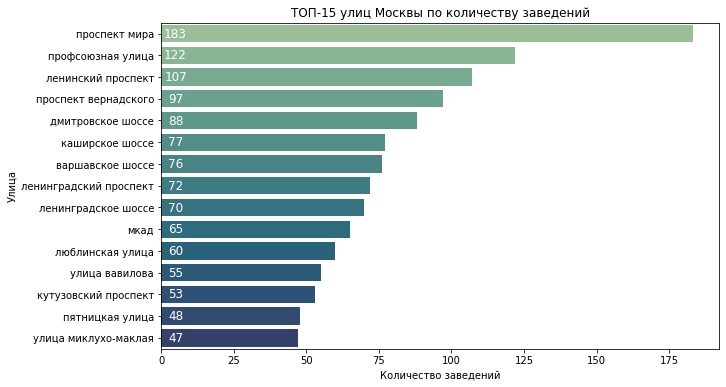

In [24]:
print('Количество улиц Москвы в предоставленных данных:',data['street'].nunique())

#создаем таблицу с группировкой по улицам и количеству заведений
street_top_15=data.groupby('street')['name'].count()\
                        .sort_values(ascending=False).head(15).reset_index()\
                        .rename(columns={'street':'Улица',
                                     'name':'Количество заведений'})
#строим график
plt.figure(figsize=(10, 6))
colors=sns.set_palette("crest")
ax = sns.barplot(x='Количество заведений', y='Улица', data=street_top_15, palette="crest")
for i in range(len(street_top_15['Количество заведений'])):
    ax.text(5, i, street_top_15['Количество заведений'][i], ha='center', va='center',c='white',size='large')
plt.title('ТОП-15 улиц Москвы по количеству заведений')
plt.show()

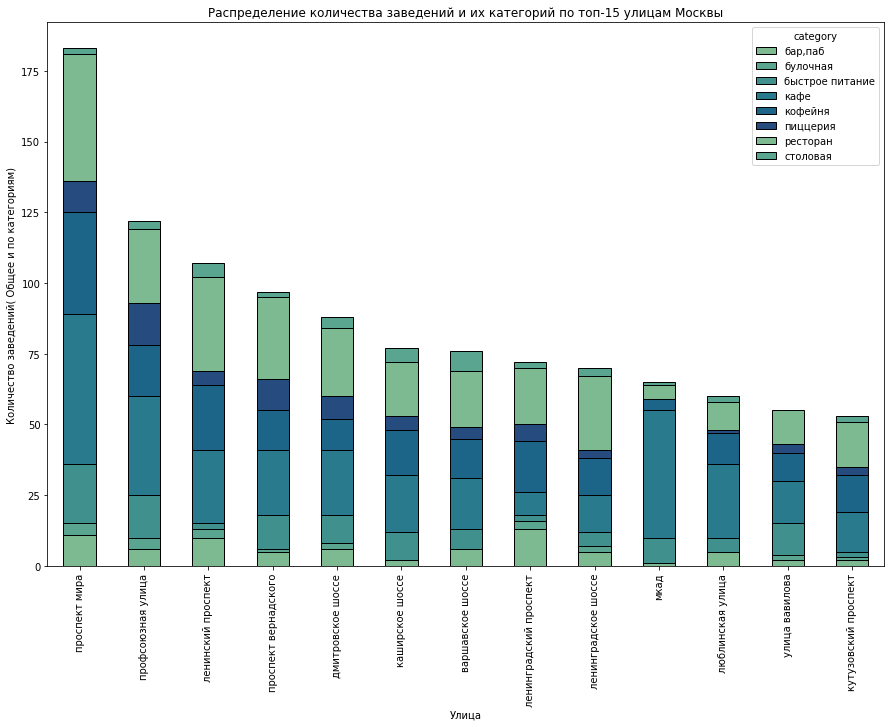

In [110]:
#построим график распределения количества заведений и их категорий по этим улицам
data_top15 = data[data['street'].isin(street_top_15['Улица'])]
data_top15.pivot_table(index = 'street',values='name',columns = 'category', aggfunc='count',margins=True)\
                            .sort_values('All',axis=0, ascending=False)\
                            .iloc[1:14, :-1]\
                            .plot(kind='bar', stacked=True, figsize=(15, 10), ec='k',color=colors)
# sns.histplot(data=data_top15, x="street", hue="category",multiple="stack",palette="viridis")
plt.xticks(rotation=90)
plt.title('Распределение количества заведений и их категорий по топ-15 улицам Москвы')
plt.xlabel('Улица')
plt.ylabel('Количество заведений( Общее и по категориям)')
plt.show()

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* Больше всего заведенй находится на проспекте Мира, следующие по популярности это Профсоюзная улица и Ленинский проспект
* Меньше всего заведений на Пятницкой улице
* По категориям на топовых улицах Москвы преобладают кафе и рестораны, меньше всего булочных
 
</div>       
<br>

### Улицы на которых находится только одно заведение

Проанализиурем улицы на которых находится только одно заведение общественного питания:

In [26]:
#сортируем данные по улицам на которых находится 1 заведение общестенного питания
one_place_data = data['street'].value_counts().reset_index()
one_place_data.columns = ['Улица', 'Кол-во заведений']
one_place_data = one_place_data[one_place_data['Кол-во заведений']==1]
print('Количество улиц с одним объектом общепита:', len(one_place_data))

#группируем данные по типу заведения сетевое/не сетевое
one_place_df=data[data['street'].isin(one_place_data['Улица'])]
one_place_сhain=one_place_df.groupby('chain')['name'].count().sort_values(ascending=False)
display(one_place_сhain)

#группируем данные по категории заведения
one_place_category=one_place_df.groupby('category')['name'].count().sort_values(ascending=False)
display(one_place_category)

Количество улиц с одним объектом общепита: 458


chain
0    325
1    133
Name: name, dtype: int64

category
кафе               159
ресторан            93
кофейня             85
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: name, dtype: int64

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* В представленных данных присутствует 458 улиц на которых расположен только 1 заведение общественного питания
* 2/3 из этих заведений не сетевые
* В таких заведениях преобладают кафе, меньше всего булочные
 
</div>       
<br>

### Средние чеки заведений

В наших данных представлена информация о средних чеках в заведниях общественного питания. Проанализируем информацию о них в разрезе административных районов города:

In [27]:
#группируем данные по административным округам и среднему чеку
mid_bill_distr= data.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)
display(mid_bill_distr)

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            550.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [28]:
#сттроим картограмму
Choropleth(
    geo_data=state_geo,
    data=mid_bill_distr,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

По данным видно, что самый высокий средний чек в заведениях общественного питания Центрального и Западного административного округов. Разбеерм их отдеьно

In [29]:
CAO= data.query('district=="Центральный административный округ"').groupby('category')['middle_avg_bill'].describe()
CAO

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",173.0,1479.739884,805.791404,215.0,1000.00,1250.0,1750.00,5500.0
булочная,12.0,1237.916667,896.552636,260.0,500.00,962.5,2125.00,2500.0
быстрое питание,49.0,532.081633,435.980257,125.0,350.00,450.0,600.00,3200.0
кафе,206.0,761.830097,439.379879,67.0,400.00,700.0,1000.00,2250.0
кофейня,82.0,794.573171,615.627353,0.0,350.00,500.0,1212.50,2500.0
пиццерия,81.0,1104.839506,597.319773,200.0,600.00,1000.0,1500.00,3000.0
ресторан,399.0,1569.586466,1104.319189,120.0,850.00,1250.0,2000.00,7250.0
столовая,44.0,319.886364,95.305437,200.0,261.25,300.0,338.75,775.0


In [30]:
ZAO= data.query('district=="Западный административный округ"').groupby('category')['middle_avg_bill'].describe()
ZAO

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",17.0,1341.176471,468.453337,350.0,1100.00,1250.0,1500.0,2250.0
булочная,8.0,723.125000,520.088849,150.0,426.25,600.0,762.5,1750.0
быстрое питание,30.0,432.333333,222.941671,165.0,317.50,367.5,500.0,1250.0
кафе,62.0,826.838710,581.527333,125.0,350.00,625.0,1150.0,2500.0
кофейня,18.0,694.444444,490.839284,50.0,400.00,600.0,850.0,2250.0
пиццерия,42.0,905.071429,590.808433,250.0,518.25,700.0,1100.0,3000.0
ресторан,114.0,1475.657895,861.379197,275.0,1000.00,1250.0,1750.0,5250.0
столовая,11.0,275.454545,48.034079,175.0,250.00,300.0,300.0,340.0


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
* Самый высокий средний чек в заведениях общественного питания Центрального и Западного административного округов.
* Самый низкий средний чек в Юго-Восточном административном округе
* в ЦАО самая дорогая категория заведений это рестораны и бары/пабы, в ЗАО ситуация чуть смещается в сторону ресторанов и и пиццерий.
* Самый низкий средний чек в данных округах опказался в категории "Столовые"

 
</div>       
<br>

### Общий вывод по анализу данных

<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
В ходе исследования было проанализировано 8406 заведений общественного питания города Москвы.
Можно сделать следующие выводы:

* Среди категорий заведений преобладают:Кафе-2354 заведения, Ресторан-2021 заведение, Кофейня-1397 заведений. Все вместе они занимают более 60% рынка заведений общественного питания
Самая не популярная категория-Булочные-255 заведений
* По количетсву посадочных мест в заведенияз лидируют рестораны и пабы. В среднем в этих заведениях 80-85 посадочных мест. Меньше всего посадочных мест в булочных, в среднем около 50
* Более 60% завведений Москвы являются сетевыми.
* Самым попуярными сетевыми заведениями являются Шоколадница, Домино`с пицца и Додо пицца
* Больше всего заведений расположено в Центральном административном округе, меньше всего в Северо-Западном. В ЦАО преобладают кафе и рестораны
* Самые высокий средний рейтинг у баров\пабов, а также у заведений находящихся в в Центрольном административном округе
* Больше всего заведений находится на проспекте Мира и Профсоюзной улице. На топовых улицах преобладают рестораны и кафе.
* Самыый высокий средний чек в заведениях которые находятся в Центральном и Западном административном округах.

</div>       
<br>

<hr style="border: 2px solid #425F57;" />

## Детализируем исследование: открытие кофейни

Преположительно, инвесторы планируют открыть в Москве кофейню. Проанализируем это направление:

### Количество кофеен в Москве

In [31]:
#считаем общее количество кофеен в Москве
coffee_house=data[data['category'] == 'кофейня']
print('Количество кофеен в Москве:', len(coffee_house))

Количество кофеен в Москве: 1397


### Расположение кофеен

category,Административный округ,Кол-во кофеен
0,Центральный административный округ,425
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,131
5,Восточный административный округ,103
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


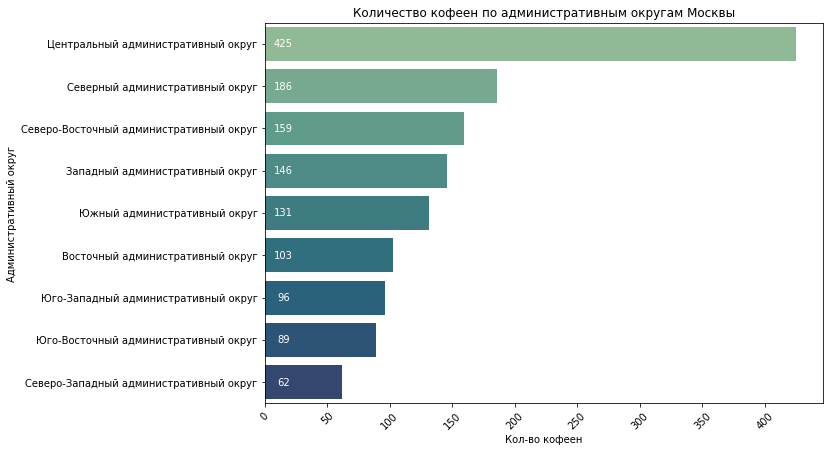

In [32]:
#Строим таблицу
district_coffee = data[data['category'] == 'кофейня'].pivot_table(index = 'district',values='name',columns = 'category', aggfunc='count')\
                           .sort_values('кофейня', ascending=False).reset_index()\
                            .rename(columns={'district':'Административный округ',
                                            'кофейня':'Кол-во кофеен'})
                            
#Выводим таблицу
display(district_coffee)

#Строим график
plt.figure(figsize=(10, 7))
ax = sns.barplot(y='Административный округ', x='Кол-во кофеен', data=district_coffee,palette="crest")
for i in range(len(district_coffee['Кол-во кофеен'])):
    ax.text(15,i, district_coffee['Кол-во кофеен'][i], ha='center', va='center',c='white')
plt.title('Количество кофеен по административным округам Москвы')
plt.xticks (rotation= 45 )
plt.show()

### Круглосуточные кофейни

In [33]:
#фильтруем данные по времени работы кофейни
coffee_house_24_7 = coffee_house[coffee_house['is_24/7'] == True]
print('Количество круглосуточных кофеен в Москве:', len(coffee_house_24_7))

#группируем данные по округам
coffee_house_24_7_district=coffee_house_24_7.groupby('district')['name'].agg('count').sort_values(ascending=False)
coffee_house_24_7_district


Количество круглосуточных кофеен в Москве: 59


district
Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: name, dtype: int64

### Рейтинги кофеен

In [34]:
#сгруппируем данные по округам и прсчитаем средний рейтинг
coffee_house_rating = coffee_house.groupby('district',as_index=False)['rating'].agg('mean').round(2)\
                                        .sort_values('rating', ascending=False).reset_index(drop=True)\
                                        .rename(columns={'district':'Административный округ',
                                                        'rating':'Средний рейтинг'})
coffee_house_rating

,Административный округ,Средний рейтинг
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Восточный административный округ,4.29
3,Северный административный округ,4.29
4,Юго-Западный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.19


In [35]:
# создаём карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house_rating,
    columns=['Административный округ', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

# выводим карту
m

### Средняя стоимость чашки капучино в кофейнях Москвы

In [36]:
#Сгруппируем данные по округам и посчитаем среднюю стоимость чашки капучино
coffee_cup = coffee_house.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2)\
                                                .sort_values('middle_coffee_cup', ascending=False).reset_index(drop=True)\
                                                .rename(columns={'district':'Административный округ',
                                                        'middle_coffee_cup':'Средняя стоимость чашки капучино'})
display(coffee_cup)
print('Средняя стоимость чашки капучино в кофейнях Москвы:', coffee_cup['Средняя стоимость чашки капучино'].mean().round(2))

,Административный округ,Средняя стоимость чашки капучино
0,Западный административный округ,188.56
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
5,Северо-Восточный административный округ,165.33
6,Южный административный округ,158.49
7,Юго-Восточный административный округ,151.09
8,Восточный административный округ,140.02


Средняя стоимость чашки капучино в кофейнях Москвы: 167.45


<div style="border-radius: 15px; box-shadow: 4px 4px 4px; border: solid black 2px; padding: 20px"> <b>Вывод:</b><br>
    
В случае если инвесторы будут открывать кофейню, можно дать следующие рекомендации:
* Конкуренция при открытии кофейнии достаточно большая, 17 % рынка всех заведений Москвы занимают именно кофейни.
* При этом это достаточно популярное направление и пользуется спросом у людей.
* В Северо-Западном администартивном округе конкуренция будет меньше, т.к. заведений там меньше всего. При этом стоимость чашки капучино там держится на уровне среднего по Москве(~ 165 р). Стоит изучить это округ подробнее.
* Рейтинги коффеен там также хорошие
* Если рассматривать Центральный округ, то лучше открывать круглосуточную кофейню, т.к. они там пользуются популярностью.
</div>       
<br>

Презентация : https://disk.yandex.ru/i/0nLzN5mgudz9PQ